# **WordClouds comparing**
![](https://dev-res.thumbr.io/libraries/14/30/90/lib/1571997780907_2.jpg?size=854x493s&ext=jpg)

Now we are going to compare two types of word clouds, formed from the term TF and TFIDF, which will be extracted from different datasets separated according to:
* Congress Period
* Presidential period


# 1. Libraries

In [100]:
import pandas as pd
import re
import nltk
import string
from nltk.tokenize import word_tokenize
from nltk.stem.porter import PorterStemmer
from nltk.stem import SnowballStemmer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import operator
import math

Descarga de la libreria para los stopwords

In [101]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

# 2. Modules

## 2.1. Data Reading

In [102]:
def read_data(path, key, key2):
    data = pd.read_csv(path, sep=';')
    title_list_row = data[key].values.tolist()
    object_list_row = data[key2].values.tolist()
    list_row = []
    for i in range (len(title_list_row)):
        list_row += [str(title_list_row[i]) + str(object_list_row[i])]
    return list_row

## 2.2. Data Cleaning

In [103]:
def remove_useless_data(rows, stop_words=[]):
    new_rows = list()
    pattern1 = re.compile(
        'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+')
    pattern2 = re.compile('[,.\"!@#$%^&*(){}?/;`~:<>+=-]')
    table = str.maketrans('', '', string.punctuation)

    for row in rows:
        row = row.lower()
        row = pattern1.sub('', row)
        row = pattern2.sub(' ', row)
        tokens = word_tokenize(row)
        row_no_punctuation = [w.translate(table) for w in tokens]
        row_no_num = [w for w in row_no_punctuation if w.isalpha()]
        row = [w for w in row_no_num if not w in stop_words]
        # row = [PorterStemmer().stem(w) for w in row_no_num if not w in stop_words]
        # row = [SnowballStemmer('spanish').stem(w) for w in row_no_num if not w in stop_words]
        row = ' '.join(row)
        new_rows.append(row)
    return new_rows

## 2.3. Stemmer

In [104]:
def stemmer(words_dict):
    roots = [SnowballStemmer('spanish').stem(w) for w in words_dict.keys()]
    roots = list(set(roots))
    stemmedwords = dict()
    for key in words_dict.keys():
        for word in roots:
            if word in key:
                stemmedwords[key]=words_dict[key]
                roots.remove(word)
                break
        if len(roots)==0:
            break
    return stemmedwords

## 2.4. Show WordCloud

In [105]:
def show_wordcloud(sentences, save=False, img_name=None):
  wordcloud = WordCloud(
    background_color = 'white',
    max_words = 1000,
    relative_scaling = 1,
    scale = 3,
    random_state=1,
    collocations=False
  ).generate_from_frequencies(sentences)
  fig = plt.figure(1, figsize=(12, 12))
  plt.axis('off')
  plt.imshow(wordcloud)
  if save: plt.savefig(img_name)
  plt.show()

## 2.6 Word frequency counter

In [106]:
def count_word_frecuency(words):
    w_frequency = dict()
    for word in words:
        if word not in w_frequency:
            w_frequency[word]=words.count(word)
    sorted_d = dict( sorted(w_frequency.items(), key=operator.itemgetter(1),reverse=True))
    return sorted_d

## 2.7. Total Terms(tf, idf, tfidf)

In [107]:
def total_terms(sentences):
    words = []
    for i in sentences:
        words+=i.split()
    tf = count_word_frecuency(words)
    idfcount = dict()
    for row in sentences:
        temp = []
        for w in row.split(' '):
            if w not in temp:
                temp.append(w)
                if w in idfcount:
                    idfcount[w] += 1
                else:
                    idfcount[w] = 1

    sortedtf = dict(sorted(tf.items(), key=operator.itemgetter(1),reverse=True))
    sortedidf = dict(sorted(idfcount.items(), key=operator.itemgetter(1),reverse=True))

    idfValues = dict()
    for key in sortedtf.keys():
        idfValues[key] = math.log10(len(sentences)/idfcount[key])
    
    tfidfValues = dict()
    for key in sortedtf.keys():
        tfidfValues[key] = idfValues[key] * tf[key]
    sortedtfidf = dict(sorted(tfidfValues.items(), key=operator.itemgetter(1),reverse=True))

    return sortedtf, idfValues, sortedtfidf

## 2.8 Show a table with all the terms

In [108]:
def show_num_terms(dicts, sortby):
    columnnames = ['tf','idf','tfidf']
    summary = []
    for key in dicts[0].keys():
        summary.append([dicts[0][key], dicts[1][key], dicts[2][key]])
    df = pd.DataFrame(summary,index = dicts[0].keys(), columns = columnnames)
    with pd.option_context('display.max_rows', None, 'display.max_columns', None):
        display(df.sort_values(by=columnnames[sortby], ascending=False))

# 3. Código principal

In [109]:
if __name__ == "__main__":
    stop_words_file = open('../input/spanish-processing-language/spanish_stopwords.txt', 'r')
    spanish_stop_words = stop_words_file.read().splitlines()
    stop_words_file.close()

# 4. Resultados

## 4.1. Congressional periods
![](https://www.congreso.gob.pe/Docs/spa/images/pleno2020.jpg)

### 4.1.1. First congress(Pre-covid19)

In [110]:
rows = read_data('../input/proposed-laws-peru-201611072021/First_congress.csv', 'Título','Objeto')
rows = remove_useless_data(rows, spanish_stop_words)
tff, idff, tfidf = total_terms(rows)

#### Comparamos los valores en una tabla ordenada por tf(0), idf(1), tfidf(2)

In [111]:
show_num_terms([tff,idff,tfidf],0)

,tf,idf,tfidf
decreto,1154,0.953258,1100.060222
provincia,1013,0.932836,944.962618
departamento,957,0.950053,909.200993
legislativo,861,1.093475,941.482342
artículos,833,0.934373,778.332776
perú,800,0.950053,760.042628
creación,764,1.051175,803.097634
distrito,724,1.103589,798.998307
código,657,1.103589,725.057856
salud,613,1.197101,733.823200


#### 4.1.1.1 TF

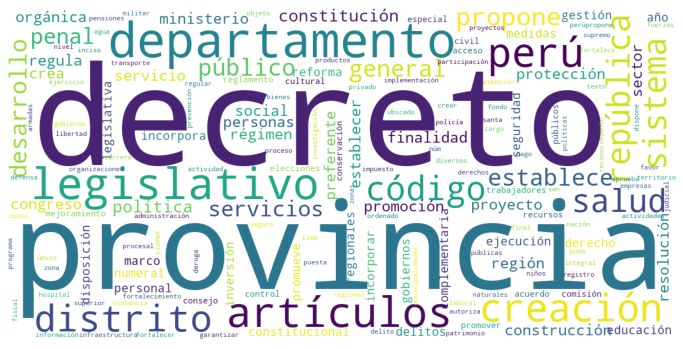

In [112]:
show_wordcloud(stemmer(tff), save=True, img_name='WordCloud_First_congress_tf.png')

#### 4.1.1.2 TFIDF

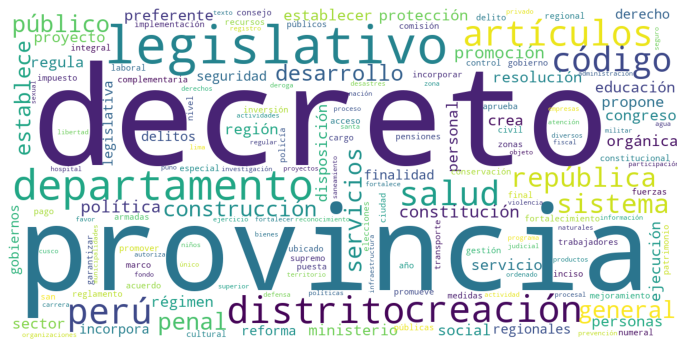

In [113]:
show_wordcloud(stemmer(tfidf), save=True, img_name='WordCloud_First_congress_tfidf.png')

### 4.1.2. Second congress

In [114]:
rows = read_data('../input/proposed-laws-peru-201611072021/Second_congress.csv', 'Título','Objeto')
rows = remove_useless_data(rows, spanish_stop_words)
tf, idf, tfidf = total_terms(rows)

#### Comparamos los valores en una tabla ordenada por tf(0), idf(1), tfidf(2)

In [115]:
show_num_terms([tf,idf,tfidf],2)

,tf,idf,tfidf
provincia,859,0.839162,720.839853
departamento,779,0.874315,681.091199
creación,734,0.915911,672.278608
salud,643,1.037875,667.353635
decreto,648,1.027621,665.898655
distrito,700,0.937716,656.401389
covid,619,0.949648,587.832228
sistema,528,1.063834,561.704117
emergencia,547,1.003683,549.014806
legislativo,356,1.300623,463.021665


#### 4.1.2.1 TF

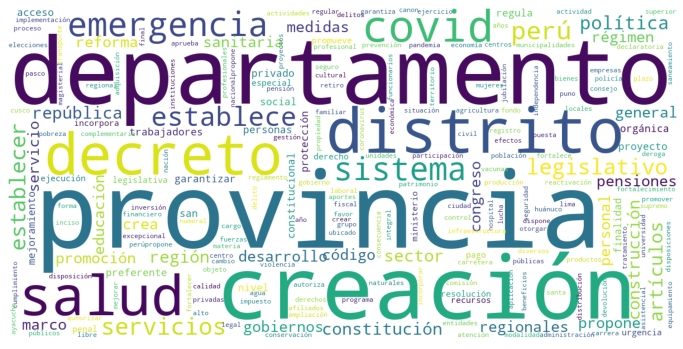

In [116]:
show_wordcloud(stemmer(tf), save=True, img_name='WordCloud_Second_congress_tf.png')

#### 4.1.2.2 TFIDF

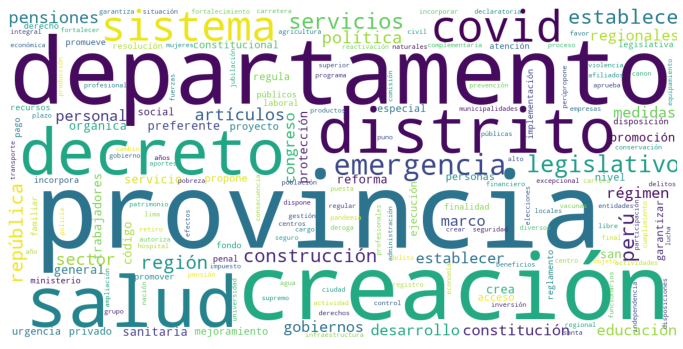

In [117]:
show_wordcloud(stemmer(tfidf), save=True, img_name='WordCloud_Second_congress_tfidf.png')

## 4.2. Presidential periods

### 4.2.1. Pedro Pablo Kuczynski
![PPK](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcT6FxAvm1iJZvW-PK_CEL24_kHvF5oM6CcxYJFwi3P92uYllVpspYOtRPct3AjA03TsrWfF_iul&usqp=CAU)

In [118]:
rows = read_data('../input/proposed-laws-peru-201611072021/PKuczynski_period.csv', 'Título','Objeto')
rows = remove_useless_data(rows, spanish_stop_words)
tfPK, idfPK, tfidfPK = total_terms(rows)

#### Comparamos los valores en una tabla ordenada por tf(0), idf(1), tfidf(2)

In [119]:
show_num_terms([tfPK,idfPK,tfidfPK],2)

,tf,idf,tfidf
decreto,677,0.921595,623.919864
legislativo,537,1.036928,556.830426
provincia,584,0.903922,527.890337
departamento,538,0.924379,497.315913
creación,475,1.002166,476.028879
distrito,417,1.074717,448.156876
artículos,469,0.914712,429.000064
código,363,1.105386,401.254954
salud,323,1.210314,390.931271
perú,405,0.960773,389.113218


#### 4.2.1.1 TF

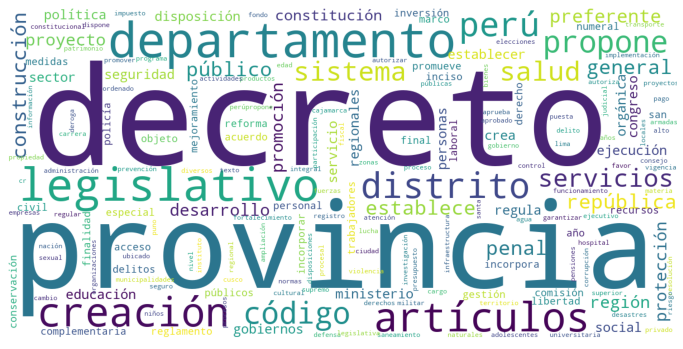

In [120]:
show_wordcloud(stemmer(tfPK), save=True, img_name='WordCloud_PKuczynski_period_tf.png')

#### 4.2.1.2 TFIDF

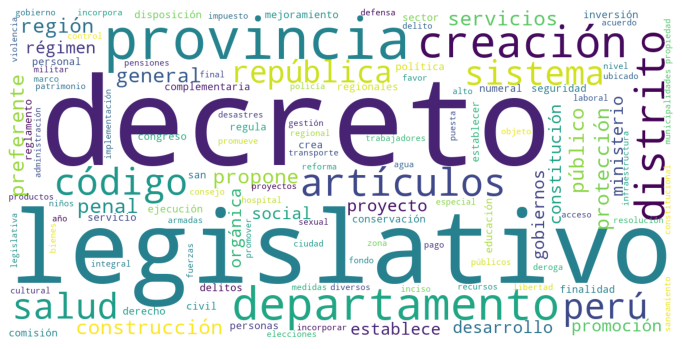

In [121]:
show_wordcloud(stemmer(tfidfPK), save=True, img_name='WordCloud_PKuczynski_period_tfidf.png')

### 4.2.2. Martín Alberto Vizcarra Cornejo
![MartinV](https://img.wattpad.com/useravatar/MartinVizcarra_.128.971053.jpg)

In [122]:
rows = read_data('../input/proposed-laws-peru-201611072021/MVizcarra_period.csv', 'Título','Objeto')
rows = remove_useless_data(rows, spanish_stop_words)
tfMV, idfMV, tfidfMV = total_terms(rows)

#### Comparamos los valores en una tabla ordenada por tf(0), idf(1), tfidf(2)

In [123]:
show_num_terms([tfMV,idfMV,tfidfMV],2)

,tf,idf,tfidf
decreto,816,1.004559,819.720139
provincia,766,0.982228,752.386681
departamento,729,0.998061,727.586251
salud,667,1.088568,726.075004
creación,627,1.062863,666.414990
sistema,588,1.102015,647.984788
distrito,570,1.125876,641.749075
legislativo,508,1.222425,620.991912
perú,632,0.970974,613.655322
república,503,1.171473,589.250806


#### 4.2.2.1 TF

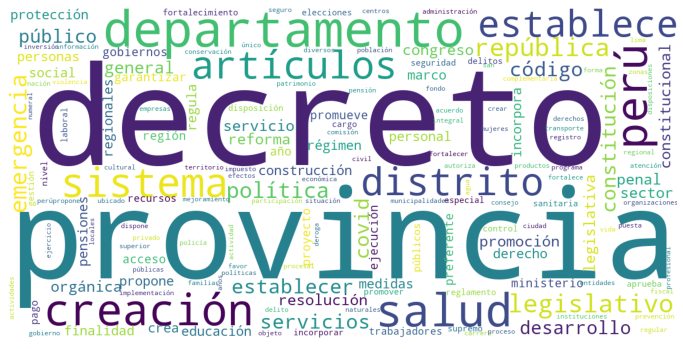

In [124]:
show_wordcloud(stemmer(tfMV), save=True, img_name='WordCloud_MVizcarra_period_tf.png')

#### 4.2.2.2 TFIDF

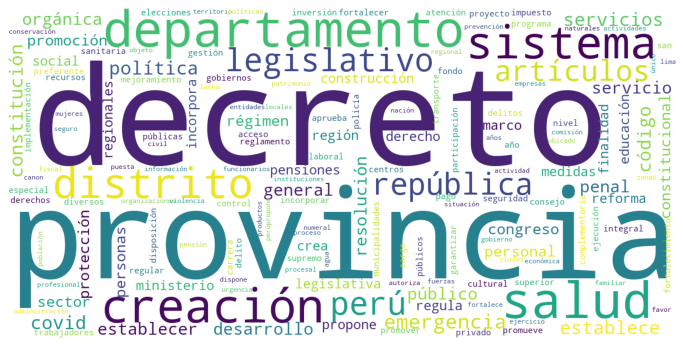

In [125]:
show_wordcloud(stemmer(tfidfMV), save=True, img_name='WordCloud_MVizcarra_period_tf.png')

### 4.2.3. Manuel Arturo Merino de Lama
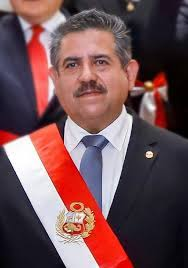

In [126]:
rows = read_data('../input/proposed-laws-peru-201611072021/MMerino_period.csv', 'Título','Objeto')
rows = remove_useless_data(rows, spanish_stop_words)
tfMM, idfMM, tfidfMM = total_terms(rows)

#### Comparamos los valores en una tabla ordenada por tf(0), idf(1), tfidf(2)

In [127]:
show_num_terms([tfMM,idfMM,tfidfMM],2)

,tf,idf,tfidf
lima,5,0.90309,4.51545
minería,4,0.90309,3.61236
decreto,4,0.90309,3.61236
urgencia,4,0.90309,3.61236
agricultura,3,0.90309,2.70927
familiar,3,0.90309,2.70927
familias,3,0.90309,2.70927
respuesta,4,0.60206,2.40824
covid,4,0.60206,2.40824
artículos,4,0.60206,2.40824


#### 4.2.3.1 TF

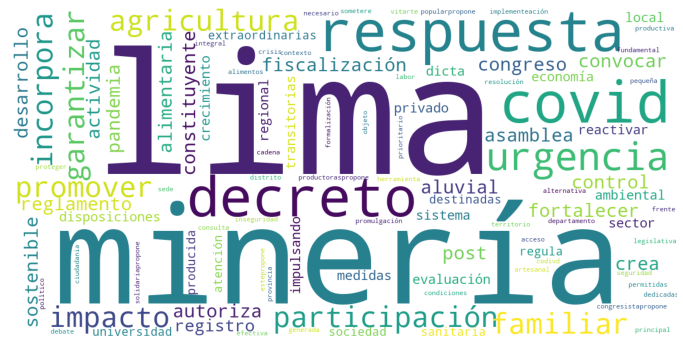

In [128]:
show_wordcloud(stemmer(tfMM), save=True, img_name='WordCloud_MMerino_period_tf.png')

#### 4.2.3.1 TFIDF

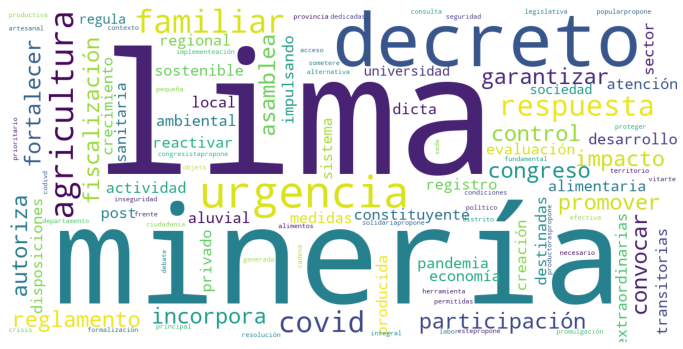

In [129]:
show_wordcloud(stemmer(tfidfMM), save=True, img_name='WordCloud_MMerino_period_tfidfMM.png')

### 4.2.4. Francisco Rafael Sagasti Hochhausler
![sagasti](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSaLWUVtShzwwPbiSQBuUbL27Idvuep2HvEWZYXtv5sREMETgrfZy2jKZHoyG4I0Wzl5aih0BMpgNc&usqp=CAU)

In [130]:
rows = read_data('../input/proposed-laws-peru-201611072021/FSagasti_period.csv', 'Título','Objeto')
rows = remove_useless_data(rows, spanish_stop_words)
tfFS, idfFS, tfidfFS = total_terms(rows)

In [131]:
show_num_terms([tfFS,idfFS,tfidfFS],2)

,tf,idf,tfidf
provincia,521,0.695271,362.236314
departamento,468,0.740517,346.562186
distrito,436,0.787222,343.228874
creación,394,0.824838,324.986320
decreto,305,1.039848,317.153549
salud,266,1.097840,292.025346
sistema,221,1.101735,243.483367
legislativo,172,1.301960,223.937057
covid,190,1.113634,211.590444
región,184,1.147058,211.058611


#### 4.2.4.1 TF

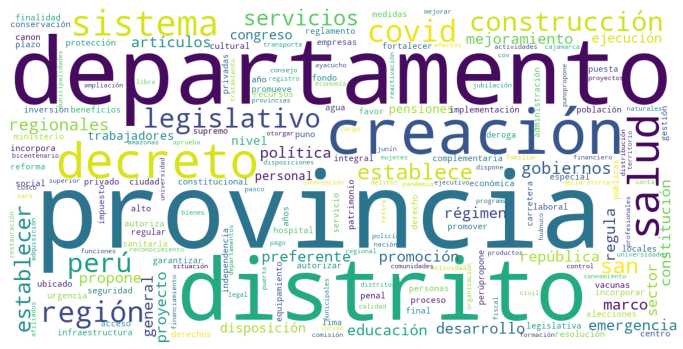

In [132]:
show_wordcloud(stemmer(tfFS), save=True, img_name='WordCloud_FSagasti_period_tf.png')

#### 4.2.4.2 TFIDF

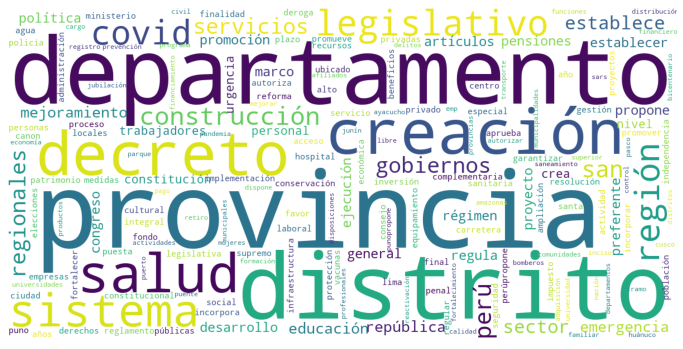

In [133]:
show_wordcloud(stemmer(tfidfFS), save=True, img_name='WordCloud_FSagasti_period_tfidf.png')